# Postprocessing of output data

In [1]:
import numpy as np
import netCDF4
import pandas as pd
import xarray as xr
import glob #return all file paths that match a specific pattern
import matplotlib as mpl
import matplotlib.pyplot as plt

import sys; sys.path.append("..")
from dataset_manipulation import fix_cam_time

**NOTE**: If you then copy this to NIRD remember to change the path of the input files and the libraries

In [2]:
# Path to import and export
raw_path = '../../../archive/' #Betzy: /cluster/home/adelez/nird/ #Nird: /nird/home/adelez/storage/
processed_path = '../../processed-data/postprocessing/'

# Case
casename = 'IDEAL-ON_2000_sec_nudg_f19_f19'
casealias = 'IDEAL-ON'

"""
casename = 'IDEAL-OFF_2000_sec_nudg_f19_f19'
casealias = 'IDEAL-OFF'

casename = 'REAL-ON_2000_sec_nudg_f19_f19'
casealias = 'REAL-ON'

casename = 'REAL-OFF_2000_sec_nudg_f19_f19'
casealias = 'REAL-OFF'"""

# Component

comp = 'atm'
#comp = 'lnd'

In [3]:
# Have a look to the variables:

fp = raw_path+casename+'/atm/hist/'+casename+'.cam.h0.2007-01.nc'
all_files = glob.glob(fp)
all_files.sort()
print("Files found")
ds0 = xr.open_mfdataset(all_files)
print("Dataset created")
ds0

Files found
Dataset created


<xarray.Dataset>
Dimensions:               (cosp_dbze: 15, cosp_ht: 40, cosp_htmisr: 16, cosp_prs: 7, cosp_reffice: 6, cosp_reffliq: 6, cosp_scol: 10, cosp_sr: 15, cosp_sza: 5, cosp_tau: 7, cosp_tau_modis: 7, ilev: 33, lat: 96, lev: 32, lon: 144, nbnd: 2, time: 1, zlon: 1)
Coordinates:
  * lat                   (lat) float64 -90.0 -88.11 -86.21 ... 86.21 88.11 90.0
  * zlon                  (zlon) float64 0.0
  * lon                   (lon) float64 0.0 2.5 5.0 7.5 ... 352.5 355.0 357.5
  * lev                   (lev) float64 3.643 7.595 14.36 ... 957.5 976.3 992.6
  * ilev                  (ilev) float64 2.255 5.032 10.16 ... 967.5 985.1 1e+03
  * cosp_prs              (cosp_prs) float64 9e+04 7.4e+04 ... 2.45e+04 9e+03
  * cosp_tau              (cosp_tau) float64 0.15 0.8 2.45 6.5 16.2 41.5 100.0
  * cosp_scol             (cosp_scol) int32 1 2 3 4 5 6 7 8 9 10
  * cosp_ht               (cosp_ht) float64 1.896e+04 1.848e+04 ... 720.0 240.0
  * cosp_sr               (cosp_sr) float64 -0.495 0.605 2.1 ... 55.0 70.0 539.5
  * cosp_sza              (cosp_sza) float64 0.0 20.0 40.0 60.0 80.0
  * cosp_dbze             (cosp_dbze) float64 -72.5 -42.5 -37.5 ... 17.5 50.0
  * cosp_htmisr           (cosp_htmisr) float64 0.0 250.0 ... 1.6e+04 1.8e+04
  * cosp_tau_modis        (cosp_tau_modis) float64 0.15 0.8 2.45 ... 41.5 100.0
  * cosp_reffice          (cosp_reffice) float64 5e-06 1.5e-05 ... 5e-05 7.5e-05
  * cosp_reffliq          (cosp_reffliq) float64 4e-06 9e-06 ... 2.5e-05
  * time                  (time) datetime64[ns] 2007-02-01
Dimensions without coordinates: nbnd
Data variables:
    zlon_bnds             (zlon, nbnd) float64 dask.array<chunksize=(1, 2), meta=np.ndarray>
    gw                    (lat) float64 dask.array<chunksize=(96,), meta=np.ndarray>
    hyam                  (lev) float64 dask.array<chunksize=(32,), meta=np.ndarray>
    hybm                  (lev) float64 dask.array<chunksize=(32,), meta=np.ndarray>
    P0                    float64 ...
    hyai                  (ilev) float64 dask.array<chunksize=(33,), meta=np.ndarray>
    hybi                  (ilev) float64 dask.array<chunksize=(33,), meta=np.ndarray>
    cosp_prs_bnds         (cosp_prs, nbnd) float64 dask.array<chunksize=(7, 2), meta=np.ndarray>
    cosp_tau_bnds         (cosp_tau, nbnd) float64 dask.array<chunksize=(7, 2), meta=np.ndarray>
    cosp_ht_bnds          (cosp_ht, nbnd) float64 dask.array<chunksize=(40, 2), meta=np.ndarray>
    cosp_sr_bnds          (cosp_sr, nbnd) float64 dask.array<chunksize=(15, 2), meta=np.ndarray>
    cosp_dbze_bnds        (cosp_dbze, nbnd) float64 dask.array<chunksize=(15, 2), meta=np.ndarray>
    cosp_htmisr_bnds      (cosp_htmisr, nbnd) float64 dask.array<chunksize=(16, 2), meta=np.ndarray>
    cosp_tau_modis_bnds   (cosp_tau_modis, nbnd) float64 dask.array<chunksize=(7, 2), meta=np.ndarray>
    cosp_reffice_bnds     (cosp_reffice, nbnd) float64 dask.array<chunksize=(6, 2), meta=np.ndarray>
    cosp_reffliq_bnds     (cosp_reffliq, nbnd) float64 dask.array<chunksize=(6, 2), meta=np.ndarray>
    date                  (time) int32 dask.array<chunksize=(1,), meta=np.ndarray>
    datesec               (time) int32 dask.array<chunksize=(1,), meta=np.ndarray>
    time_bnds             (time, nbnd) datetime64[ns] dask.array<chunksize=(1, 2), meta=np.ndarray>
    date_written          (time) |S8 dask.array<chunksize=(1,), meta=np.ndarray>
    time_written          (time) |S8 dask.array<chunksize=(1,), meta=np.ndarray>
    ndbase                int32 ...
    nsbase                int32 ...
    nbdate                int32 ...
    nbsec                 int32 ...
    mdt                   int32 ...
    ndcur                 (time) int32 dask.array<chunksize=(1,), meta=np.ndarray>
    nscur                 (time) int32 dask.array<chunksize=(1,), meta=np.ndarray>
    co2vmr                (time) float64 dask.array<chunksize=(1,), meta=np.ndarray>
    ch4vmr                (time) float64 dask.array<chunksize=(1,), meta=np.ndarray>

In [4]:
def variables_by_comp(comp):

    if comp == 'atm':

        variables = \
            {'BVOC': ['SFisoprene', 'SFmonoterp'],
             'SOA': ['N_AER', 'DOD550', 'SOA_A1','SOA_NA','cb_SOA_A1','cb_SOA_NA', 'cb_SOA_A1_OCW', 'cb_SOA_NA_OCW'],
             'CLOUDPROP': ['ACTNL', 'ACTREL','CDNUMC', 'CLDHGH', 'CLDLOW', 'CLDMED', 'CLDTOT', 'CLDLIQ', 'CLOUD', 
                           'CLOUDCOVER_CLUBB', 'FCTL', 'LWCF', 'SWCF', 'NUMLIQ', 'TGCLDLWP'],
             'RADIATIVE': ['FLNT', 'FSNT', 'FLNT_DRF', 'FLNTCDRF', 'FSNTCDRF', 'FSNT_DRF'],
             'TURBFLUXES': ['LHFLX', 'SHFLX'], #, 'OMEGAT'
             }

    elif comp =='lnd':

        lnd_vars = ['PCT_NAT_PFT','GPP', 'NPP', 'NEE', 'NEP', 'STORVEGN', 'TOTPFTN', 'TOTVEGN',
                'TOTCOLC', 'TOTECOSYSC', 'TOTPFTC', 'TOTVEGC', 'STORVEGC','TLAI']

        if casename.find('OFF')<0.:
            variables = {'LAND': ['MEG_isoprene', 'MEG_limonene', 'MEG_myrcene', 'MEG_ocimene_t_b', 
                                  'MEG_pinene_a', 'MEG_pinene_b', 'MEG_sabinene'] + lnd_vars}
        else:
            variables = {'LAND': lnd_vars}
            
    return variables

In [5]:
variables = sum([*variables_by_comp('atm').values()], [])
d = ds0[variables]
for v in variables:
    print(d[v].long_name)
    print(d[v].mean('lon').mean('lat').values)
    #.plot()
    #plt.suptitle(d[v].long_name)
    #plt.show()

isoprene surface flux
[1.7447018e-11]
monoterp surface flux
[4.3613533e-12]
Aerosol number concentration
[[1.9515255e-12 7.1730240e-11 2.3537656e-09 8.4998383e-08 2.9120256e-06
  7.0975613e-05 1.3095025e-03 2.3226814e-02 3.9300203e-01 2.2726414e+00
  5.3411889e+00 8.8569784e+00 1.3009904e+01 1.8338457e+01 2.5621515e+01
  3.4369640e+01 4.3129337e+01 5.0887222e+01 5.8681870e+01 6.8754349e+01
  8.5192169e+01 1.1184490e+02 1.5768916e+02 2.2544951e+02 2.9913400e+02
  3.6243982e+02 4.1962833e+02 4.7367758e+02 5.2166235e+02 5.7607697e+02
  6.3257501e+02 7.2666730e+02]]
Aerosol optical depth at 550nm
[0.10809896]
SOA_A1 concentration
[[5.4166921e-22 8.6581609e-21 1.3496359e-19 2.4662150e-18 5.4100659e-17
  9.3624119e-16 1.2821225e-14 1.7431647e-13 2.0331768e-12 1.1586320e-11
  2.9725594e-11 5.0290699e-11 7.1063468e-11 8.7363249e-11 9.6266051e-11
  9.9373100e-11 9.5885654e-11 8.7991676e-11 7.7973517e-11 6.9720334e-11
  6.5865674e-11 6.4867417e-11 7.3638477e-11 1.0045700e-10 1.2924699e-10
  1.51

In [6]:
def create_dataset(casename, comp, full_dset = False, spinup_months = 12, pressure_vars=False):
    
    # Set variables and model name by comp
    variables = ['LANDFRAC', 'GRIDAREA', 'gw', 'date', 'time_bnds']
    
    if comp == 'atm': 
        model = 'cam'
        
    elif comp == 'lnd': 
        model = 'clm2'
        variables = variables + ['area', 'landfrac', 'landmask', 'pftmask', 'PCT_LANDUNIT']
    # Else: launch exception
        
    if pressure_vars: 
        variables = variables + ['P0', 'hyam', 'hybm', 'PS', 'hyai', 'hybi', 'ilev']
        
    variables = variables + sum([*variables_by_comp(comp).values()], []) # from dict to flat list
        
    # Import all dataset   
    fp = raw_path+casename+'/'+comp+'/hist/'+casename+'.'+model+'.h0.*.nc'

    all_files = glob.glob(fp)
    all_files.sort()
    print("Files found")

    ds = xr.open_mfdataset(all_files)
    print("Dataset created")
    
    # Fix timestamp of model data
    #ds = fix_cam_time(ds)

    # Remove spinup months of data set
    ds = ds.isel(time=slice(spinup_months,len(ds.time)))
    print("Postprocessing completed")
    
    if full_dset: return ds
    else: return ds[variables]

In [7]:
ds = create_dataset(casename, comp, pressure_vars=True)

Files found
Dataset created
Postprocessing completed


In [8]:
ds

<xarray.Dataset>
Dimensions:           (ilev: 33, lat: 96, lev: 32, lon: 144, nbnd: 2, time: 60)
Coordinates:
  * ilev              (ilev) float64 2.255 5.032 10.16 ... 967.5 985.1 1e+03
  * lat               (lat) float64 -90.0 -88.11 -86.21 ... 86.21 88.11 90.0
  * lon               (lon) float64 0.0 2.5 5.0 7.5 ... 350.0 352.5 355.0 357.5
  * lev               (lev) float64 3.643 7.595 14.36 ... 957.5 976.3 992.6
  * time              (time) datetime64[ns] 2008-02-01 2008-03-01 ... 2013-01-01
Dimensions without coordinates: nbnd
Data variables:
    LANDFRAC          (time, lat, lon) float32 dask.array<chunksize=(1, 96, 144), meta=np.ndarray>
    GRIDAREA          (time, lat, lon) float32 dask.array<chunksize=(1, 96, 144), meta=np.ndarray>
    gw                (time, lat) float64 dask.array<chunksize=(1, 96), meta=np.ndarray>
    date              (time) int32 dask.array<chunksize=(1,), meta=np.ndarray>
    time_bnds         (time, nbnd) datetime64[ns] dask.array<chunksize=(1, 2), meta=np.ndarray>
    P0                (time) float64 1e+05 1e+05 1e+05 ... 1e+05 1e+05 1e+05
    hyam              (time, lev) float64 dask.array<chunksize=(1, 32), meta=np.ndarray>
    hybm              (time, lev) float64 dask.array<chunksize=(1, 32), meta=np.ndarray>
    PS                (time, lat, lon) float32 dask.array<chunksize=(1, 96, 144), meta=np.ndarray>
    hyai              (time, ilev) float64 dask.array<chunksize=(1, 33), meta=np.ndarray>
    hybi              (time, ilev) float64 dask.array<chunksize=(1, 33), meta=np.ndarray>
    SFisoprene        (time, lat, lon) float32 dask.array<chunksize=(1, 96, 144), meta=np.ndarray>
    SFmonoterp        (time, lat, lon) float32 dask.array<chunksize=(1, 96, 144), meta=np.ndarray>
    N_AER             (time, lev, lat, lon) float32 dask.array<chunksize=(1, 32, 96, 144), meta=np.ndarray>
    DOD550            (time, lat, lon) float32 dask.array<chunksize=(1, 96, 144), meta=np.ndarray>
    SOA_A1            (time, lev, lat, lon) float32 dask.array<chunksize=(1, 32, 96, 144), meta=np.ndarray>
    SOA_NA            (time, lev, lat, lon) float32 dask.array<chunksize=(1, 32, 96, 144), meta=np.ndarray>
    cb_SOA_A1         (time, lat, lon) float32 dask.array<chunksize=(1, 96, 144), meta=np.ndarray>
    cb_SOA_NA         (time, lat, lon) float32 dask.array<chunksize=(1, 96, 144), meta=np.ndarray>
    cb_SOA_A1_OCW     (time, lat, lon) float32 dask.array<chunksize=(1, 96, 144), meta=np.ndarray>
    cb_SOA_NA_OCW     (time, lat, lon) float32 dask.array<chunksize=(1, 96, 144), meta=np.ndarray>
    ACTNL             (time, lat, lon) float32 dask.array<chunksize=(1, 96, 144), meta=np.ndarray>
    ACTREL            (time, lat, lon) float32 dask.array<chunksize=(1, 96, 144), meta=np.ndarray>
    CDNUMC            (time, lat, lon) float32 dask.array<chunksize=(1, 96, 144), meta=np.ndarray>
    CLDHGH            (time, lat, lon) float32 dask.array<chunksize=(1, 96, 144), meta=np.ndarray>
    CLDLOW            (time, lat, lon) float32 dask.array<chunksize=(1, 96, 144), meta=np.ndarray>
    CLDMED            (time, lat, lon) float32 dask.array<chunksize=(1, 96, 144), meta=np.ndarray>
    CLDTOT            (time, lat, lon) float32 dask.array<chunksize=(1, 96, 144), meta=np.ndarray>
    CLDLIQ            (time, lev, lat, lon) float32 dask.array<chunksize=(1, 32, 96, 144), meta=np.ndarray>
    CLOUD             (time, lev, lat, lon) float32 dask.array<chunksize=(1, 32, 96, 144), meta=np.ndarray>
    CLOUDCOVER_CLUBB  (time, ilev, lat, lon) float32 dask.array<chunksize=(1, 33, 96, 144), meta=np.ndarray>
    FCTL              (time, lat, lon) float32 dask.array<chunksize=(1, 96, 144), meta=np.ndarray>
    LWCF              (time, lat, lon) float32 dask.array<chunksize=(1, 96, 144), meta=np.ndarray>
    SWCF              (time, lat, lon) float32 dask.array<chunksize=(1, 96, 144), meta=np.ndarray>
    NUMLIQ            (time, lev, lat, lon) float32 dask.array<chunksize=(1, 32, 96, 144), meta=np.ndarray>
    TGCLDL

In [13]:
def fix_units(ds):
    
    ds_ = ds.copy(deep=True)
    
    for var in list(ds_.keys()):
        
        if var == "SFisoprene" or var == "SFmonoterp":
            ds_[var].values = ds_[var].values*1e+6*(60*60*24*365) # Change unit from kg/m2/s to mg/m2/y
            ds_[var].attrs["units"] = "mg/m$^2$/y"
            
        if var == "SOA_A1" or var == "SOA_NA":
            ds_[var].values = ds_[var].values*1e+9 # Change unit from kg/kg to $\mu$g/kg
            ds_[var].attrs["units"] = "$\mu$g/kg"
            
        if var == "cb_SOA_A1" or var == "cb_SOA_NA" or var == "cb_SOA_A1_OCW" or var == "cb_SOA_NA_OCW":
            ds_[var].values = ds_[var].values*1e+6 # Change unit from kg/m2 to $\mu$g/m2
            ds_[var].attrs["units"] = "mg/m$^2$"
            
        if var == "ACTNL":
            ds_[var].values = ds_[var].values*1e+6 # Change unit from m-3 to cm-3
            ds_[var].attrs["units"] = "cm$^{-3}$"
            
        if var == "CDNUMC":
            ds_[var].values = ds_[var].values*1e-10 # Change unit from 1/m2 to 1e6 cm-2
            ds_[var].attrs["units"] = "1e6 cm$^{-2}$"
            
        if var == "CLDHGH" or var == "CLDLOW" or var == "CLDMED" or var == "CLDMED":
            ds_[var].values = ds_[var].values*1e+3 # Change unit from fraction to g/kg
            ds_[var].attrs["units"] = "g/kg"
            
        if var == "CLDLIQ":
            ds_[var].values = ds_[var].values*1e+6 # Change unit from kg/kg to mg/kg
            ds_[var].attrs["units"] = "mg/kg"
            
        if var == "TGCLDLWP":
            ds_[var].values = ds_[var].values*1e+3 # Change unit from kg/m2 to g/m2
            ds_[var].attrs["units"] = "g/m$^2$"
            
        if var == "FLNT" or var == "FSNT" or var == "FLNT_DRF" or var == "FLNTCDRF" or var == "FSNT_DRF" or var == "FSNTCDRF" or var =="LHFLX" or var =="SHFLX":
            ds_[var].attrs["units"] = "W/m$^2$" # Change unit from W/m^2 to W/m2, like the other radiative fluxes
            
    return ds_

In [24]:
ds2 = fix_units(ds)

In [11]:
def print_timeseries(ds):
    variables = list(ds.data_vars)
    for i in range(11,len(variables)):
        ds[variables[i]].mean('lon').mean('lat').plot()
        ds[variables[i]].mean('lon').mean('lat').chunk({'time': None}).rolling(time=12, center=True).mean().plot()
        plt.suptitle(variables[i]+' - '+ds[variables[i]].long_name)
        plt.show()

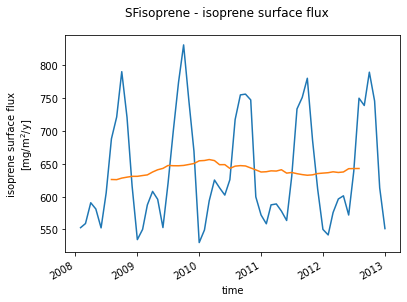

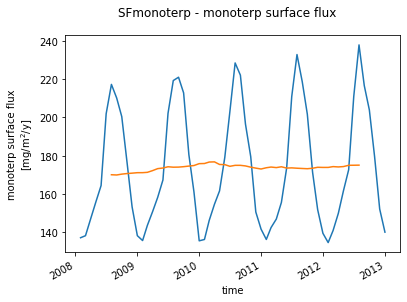

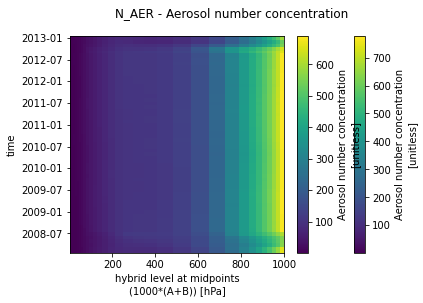

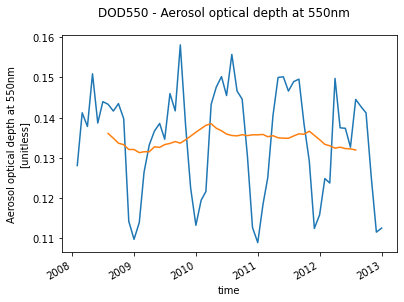

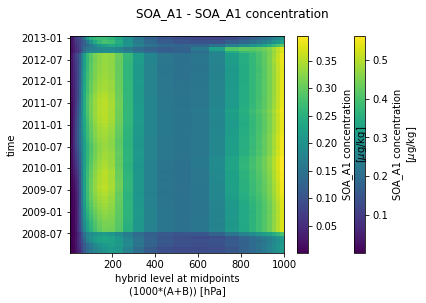

...

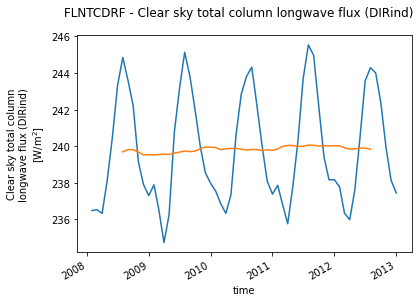

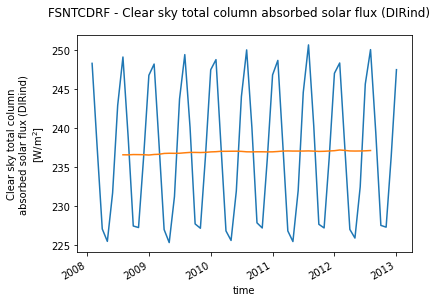

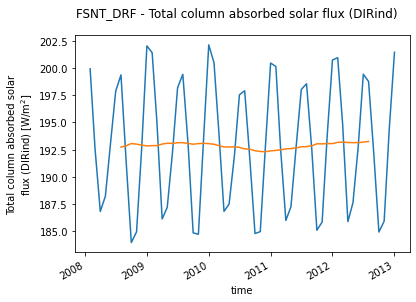

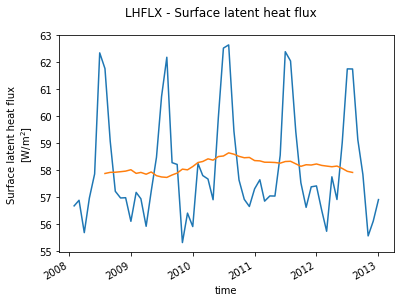

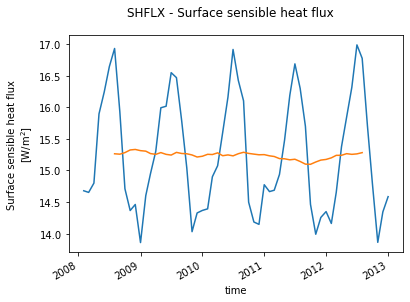

In [15]:
print_timeseries(ds2)

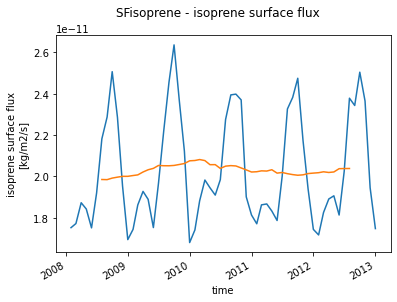

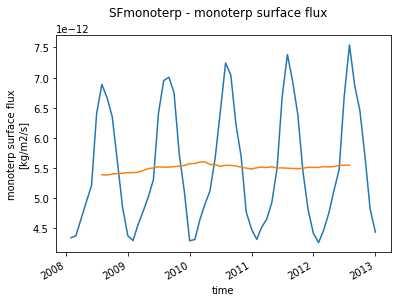

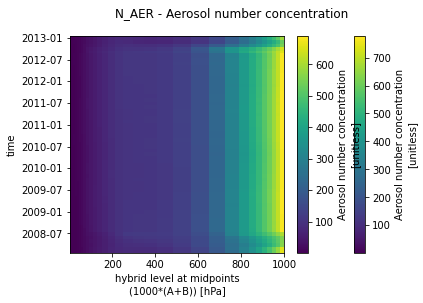

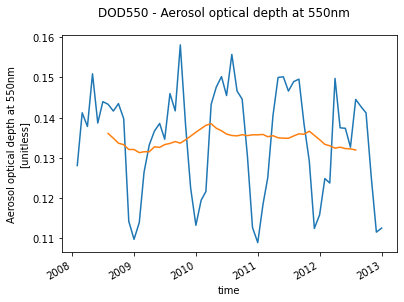

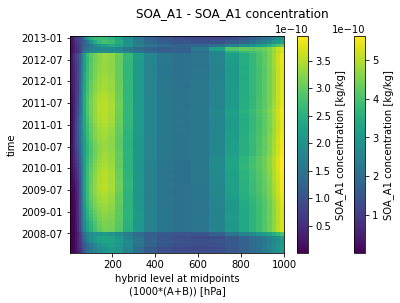

...

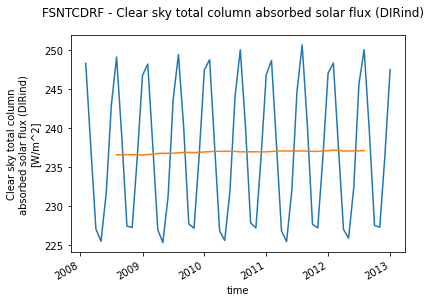

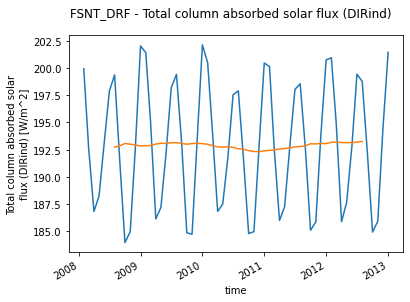

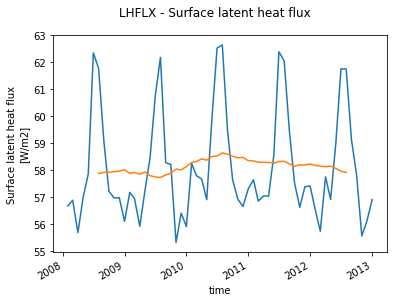

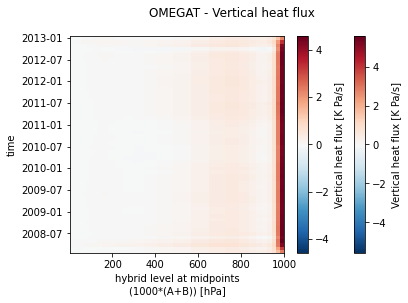

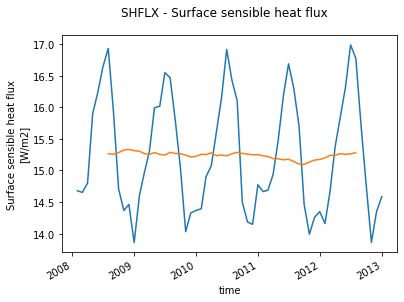

In [54]:
print_timeseries(ds)

In [22]:
def fix_names(ds):
    
    ds_ = ds.copy(deep=True)
    
    for var in list(ds_.keys()):
        
        if var == "SOA_A1":
            ds_[var].attrs["long_name"] = "SOA_A1 concentration - SOA condensate on existing particles from SOAGSV (gas)"
        if var == "SOA_NA":
            ds_[var].attrs["long_name"] = "SOA_NA concentration - SOA formed by co-nucleation with SO4"
        if var == "cb_SOA_A1":
            ds_[var].attrs["long_name"] = "SOA_A1 burden column - SOA condensate on existing particles from SOAGSV (gas)"
        if var == "cb_SOA_NA":
            ds_[var].attrs["long_name"] = "SOA_NA burden column - SOA formed by co-nucleation with SO4"
        if var == "cb_SOA_A1_OCW":
            ds_[var].attrs["long_name"] = "SOA_A1 burden column in cloud water - SOA condensate on existing particles from SOAGSV (gas)"
        if var == "cb_SOA_NA_OCW":
            ds_[var].attrs["long_name"] = "SOA_NA burden column in cloud water - SOA formed by co-nucleation with SO4"
        
        """if var == "TGCLDLWP":
            ds_[var].rename('LWP')
            ds_[var].assign_attrs["CLM5_name"] = "TGCLDLWP"
        if var == "FSNT":
            ds_[var].rename('SWTOT')
            ds_[var].assign_attrs["CLM5_name"] = "FSNT"
        if var == "FLNT":
            ds_[var].rename('LWTOT')
            ds_[var].assign_attrs["CLM5_name"] = "FLNT"
        if var == "FSNT_DRF":
            ds_[var].rename('SW_clean')
            ds_[var].assign_attrs["CLM5_name"] = "FSNT_DRF"
        if var == "FSNTCDRF":
            ds_[var].rename('SW_clean_clear')
            ds_[var].assign_attrs["CLM5_name"] = "FSNTCDRF"
        if var == "FLNT_DRF":
            ds_[var].rename('LW_clean')
            ds_[var].assign_attrs["CLM5_name"] = "FLNT_DRF"
        if var == "FLNTCDRF":
            ds_[var].rename('LW_clean_clear')
            ds_[var].assign_attrs["CLM5_name"] = "FLNTCDRF"
            """
            
    return ds_

def aerosol_cloud_forcing_scomposition_Ghan(ds):
    
    ds_ = ds.copy(deep=True)
    
    Ghan_vars = ['SWDIR_Ghan', 'LWDIR_Ghan', 'DIR_Ghan', 'SWCF_Ghan', 'LWCF_Ghan', 
                 'NCFT_Ghan', 'SW_rest_Ghan', 'LW_rest_Ghan']
    
    for var in Ghan_vars:
        
    
        if 'SWDIR_Ghan' == var:
            ds_[var] = ds_['FSNT'] - ds_['FSNT_DRF']
            ds_[var].attrs['units'] = ds_['FSNT_DRF'].attrs['units']
            ds_[var].attrs['long_name'] = "Shortwave aerosol direct radiative forcing - Ghan's scomposition"

        if 'LWDIR_Ghan' == var:
            ds_[var] = -(ds_['FLNT'] - ds_['FLNT_DRF'])
            ds_[var].attrs['units'] = ds_['FLNT_DRF'].attrs['units']
            ds_[var].attrs['long_name'] = "Longwave aerosol direct radiative forcing - Ghan's scomposition"


        if 'DIR_Ghan' == var:
            ds_[var] = ds_['LWDIR_Ghan'] + ds_['SWDIR_Ghan']
            ds_[var].attrs['units'] = ds_['LWDIR_Ghan'].attrs['units']
            ds_[var].attrs['long_name'] = "Net aerosol direct radiative forcing - Ghan's scomposition"


        if 'SWCF_Ghan' == var:
            ds_[var] = ds_['FSNT_DRF'] - ds_['FSNTCDRF']
            ds_[var].attrs['units'] = ds_['FSNT_DRF'].attrs['units']
            ds_[var].attrs['long_name'] = "Shortwave cloud radiative forcing - Ghan's scomposition"


        if 'LWCF_Ghan' == var:
            ds_[var] = -(ds_['FLNT_DRF'] - ds_['FLNTCDRF'])
            ds_[var].attrs['units'] = ds_['FLNT_DRF'].attrs['units']
            ds_[var].attrs['long_name'] = "Longwave cloud radiative forcing - Ghan's scomposition"


        if 'NCFT_Ghan' == var:
            ds_[var] = ds_['FSNT_DRF'] - ds_['FSNTCDRF'] - (ds_['FLNT_DRF'] - ds_['FLNTCDRF'])
            ds_[var].attrs['units'] = ds_['FLNT_DRF'].attrs['units']
            ds_[var].attrs['long_name'] = "Net cloud radiative forcing - Ghan's scomposition"


        if 'SW_rest_Ghan' == var:
            ds_[var] = ds_['FSNTCDRF']
            ds_[var].attrs['long_name'] = "Shortwave surface albedo radiative forcing - Ghan's scomposition"


        elif 'LW_rest_Ghan' == var:
            ds_[var] = ds_['FLNTCDRF']
            ds_[var].attrs['long_name'] = "Clear sky total column longwave flux - Ghan's scomposition"

    return ds_

In [25]:
ds3 = aerosol_cloud_forcing_scomposition_Ghan(fix_names(ds2))

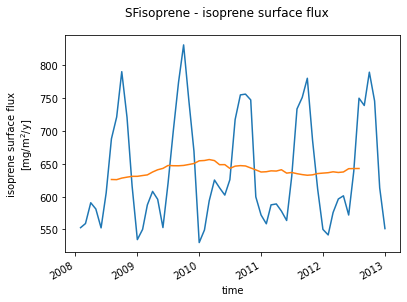

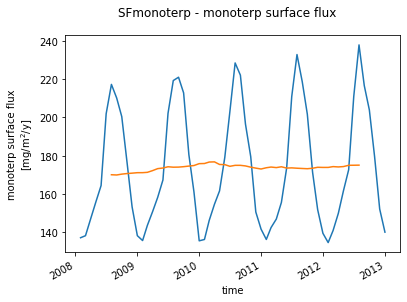

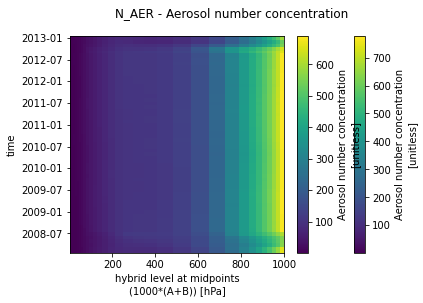

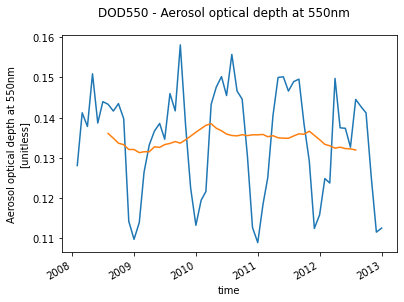

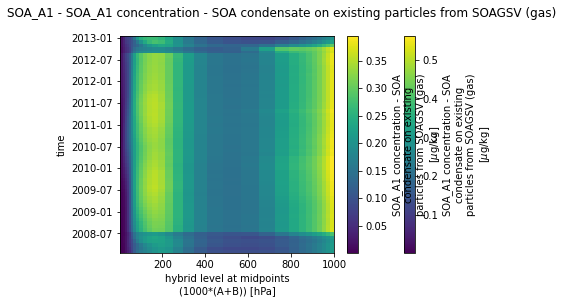

...

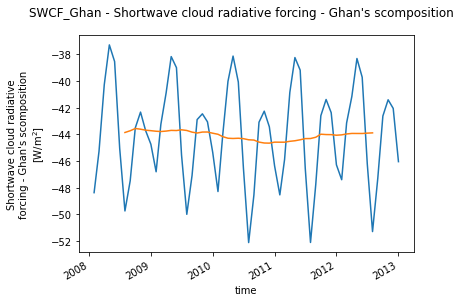

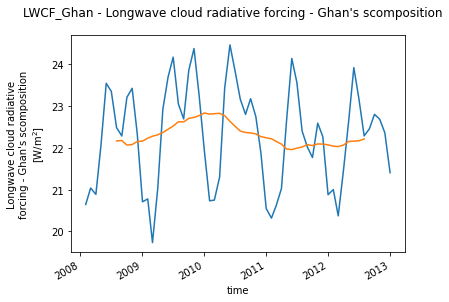

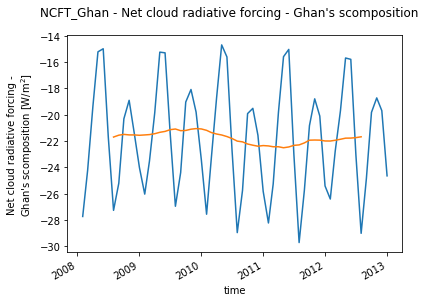

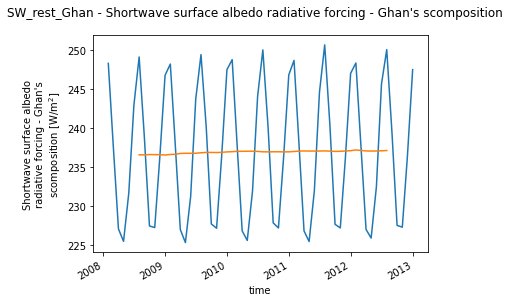

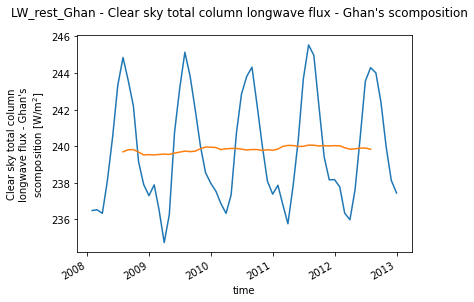

In [26]:
print_timeseries(ds3)

In [34]:
varss = variables_by_comp(comp)#
varss= varss['BVOC']
print_timeseries(ds2[varss])

['SFisoprene', 'SFmonoterp']


AttributeError: module 'cftime' has no attribute 'utime'

AttributeError: module 'cftime' has no attribute 'utime'

In [9]:
fp = raw_path+casename+'/atm/hist/'+casename+'.cam.h0.*.nc'
#VEG_SHIFT_IDEAL_2000_sec_nudg_f19_f19.cam.h0.2007-01.nc
#fp = raw_path+'IDEAL-ON_2000_sec_nudg_f19_f19/lnd/hist/IDEAL-ON_2000_sec_nudg_f19_f19.clm2.h0.2007-01.nc'

all_files = glob.glob(fp)
all_files.sort()
print("Files found")

ds_lnd = xr.open_mfdataset(all_files)
print("Dataset created")

Files found
Dataset created


In [10]:
#ds_lnd

#area, landfrac, landmask, pftmask, GPP

<xarray.Dataset>
Dimensions:                  (cft: 64, glc_nec: 10, hist_interval: 2, lat: 96, levdcmp: 25, levgrnd: 25, levlak: 10, levsoi: 20, lon: 144, ltype: 9, natpft: 15, nvegwcs: 4, time: 1)
Coordinates:
  * levgrnd                  (levgrnd) float64 0.01 0.04 0.09 ... 28.87 42.0
  * levlak                   (levlak) float64 0.05 0.6 2.1 ... 25.6 34.33 44.77
  * levdcmp                  (levdcmp) float64 0.01 0.04 0.09 ... 28.87 42.0
  * time                     (time) datetime64[ns] 2007-02-01
  * lon                      (lon) float64 0.0 2.5 5.0 7.5 ... 352.5 355.0 357.5
  * lat                      (lat) float64 -90.0 -88.11 -86.21 ... 88.11 90.0
Dimensions without coordinates: cft, glc_nec, hist_interval, levsoi, ltype, natpft, nvegwcs
Data variables:
    mcdate                   (time) int32 dask.array<chunksize=(1,), meta=np.ndarray>
    mcsec                    (time) int32 dask.array<chunksize=(1,), meta=np.ndarray>
    mdcur                    (time) int32 dask.array<chunksize=(1,), meta=np.ndarray>
    mscur                    (time) int32 dask.array<chunksize=(1,), meta=np.ndarray>
    nstep                    (time) int32 dask.array<chunksize=(1,), meta=np.ndarray>
    time_bounds              (time, hist_interval) datetime64[ns] dask.array<chunksize=(1, 2), meta=np.ndarray>
    date_written             (time) |S16 dask.array<chunksize=(1,), meta=np.ndarray>
    time_written             (time) |S16 dask.array<chunksize=(1,), meta=np.ndarray>
    area                     (lat, lon) float64 dask.array<chunksize=(96, 144), meta=np.ndarray>
    landfrac                 (lat, lon) float64 dask.array<chunksize=(96, 144), meta=np.ndarray>
    landmask                 (lat, lon) float64 dask.array<chunksize=(96, 144), meta=np.ndarray>
    pftmask                  (lat, lon) float64 dask.array<chunksize=(96, 144), meta=np.ndarray>
    nbedrock                 (lat, lon) float64 dask.array<chunksize=(96, 144), meta=np.ndarray>
    ZSOI                     (levgrnd, lat, lon) float64 dask.array<chunksize=(25, 96, 144), meta=np.ndarray>
    DZSOI                    (levgrnd, lat, lon) float64 dask.array<chunksize=(25, 96, 144), meta=np.ndarray>
    WATSAT                   (levgrnd, lat, lon) float64 dask.array<chunksize=(25, 96, 144), meta=np.ndarray>
    SUCSAT                   (levgrnd, lat, lon) float64 dask.array<chunksize=(25, 96, 144), meta=np.ndarray>
    BSW                      (levgrnd, lat, lon) float64 dask.array<chunksize=(25, 96, 144), meta=np.ndarray>
    HKSAT                    (levgrnd, lat, lon) float64 dask.array<chunksize=(25, 96, 144), meta=np.ndarray>
    ZLAKE                    (levlak, lat, lon) float64 dask.array<chunksize=(10, 96, 144), meta=np.ndarray>
    DZLAKE                   (levlak, lat, lon) float64 dask.array<chunksize=(10, 96, 144), meta=np.ndarray>
    ACTUAL_IMMOB             (time, lat, lon) float64 dask.array<chunksize=(1, 96, 144), meta=np.ndarray>
    AGNPP                    (time, lat, lon) float64 dask.array<chunksize=(1, 96, 144), meta=np.ndarray>
    ALT                      (time, lat, lon) float64 dask.array<chunksize=(1, 96, 144), meta=np.ndarray>
    ALTMAX                   (time, lat, lon) float64 dask.array<chunksize=(1, 96, 144), meta=np.ndarray>
    AR                       (time, lat, lon) float64 dask.array<chunksize=(1, 96, 144), meta=np.ndarray>
    ATM_TOPO                 (time, lat, lon) float64 dask.array<chunksize=(1, 96, 144), meta=np.ndarray>
    BAF_CROP                 (time, lat, lon) float64 dask.array<chunksize=(1, 96, 144), meta=np.ndarray>
    BAF_PEATF                (time, lat, lon) float64 dask.array<chunksize=(1, 96, 144), meta=np.ndarray>
    BCDEP                    (time, lat, lon) float64 dask.array<chunksize=(1, 96, 144), meta=np.ndarray>
    BGNPP                    (time, lat, lon) float64 dask.array<chunksize=(1, 96, 144), meta=np.ndarray>
    BTRAN2                   (time, lat, lon) float64 dask.array<chunksize=(1, 96, 144), m

In [5]:
# Fix timestamp of model data
ds = fix_cam_time(ds)

# Remove spinup months of data set
ds = ds.isel(time=slice(12,len(ds.time)))

print("Postprocessing completed")
date = '20082012'

Postprocessing completed


In [6]:
# BVOC variables
variables = ['SFisoprene', 'SFmonoterp']
ds[variables].to_netcdf(processed_path+casealias+'_'+'BVOC_'+date+'.nc')

In [7]:
"""Av = 6.022e23  # Avogadro's number
M_iso = 68.114200e-3  # Molar mass isoprene kg/mol
M_mono = 136.228400e-3  # Molar mass monoterpene kg/mol
path_this_file = str(pathlib.Path().absolute())

var_dic = dict(SFmonoterp='H10H16',
            SFisoprene='ISOP')
M_dic = dict(SFmonoterp=M_mono,
            SFisoprene=M_iso)"""

"Av = 6.022e23  # Avogadro's number\nM_iso = 68.114200e-3  # Molar mass isoprene kg/mol\nM_mono = 136.228400e-3  # Molar mass monoterpene kg/mol\npath_this_file = str(pathlib.Path().absolute())\n\nvar_dic = dict(SFmonoterp='H10H16',\n            SFisoprene='ISOP')\nM_dic = dict(SFmonoterp=M_mono,\n            SFisoprene=M_iso)"

In [7]:
# SOA variables
variables = ['N_AER', 'DOD550', 'SOA_A1','SOA_NA','cb_SOA_A1','cb_SOA_NA', 'cb_SOA_A1_OCW', 'cb_SOA_NA_OCW']
ds[variables].to_netcdf(processed_path+casealias+'_'+'SOA_'+date+'.nc')

In [9]:
# CLOUD PROPERTIES
variables = ['ACTNL', 'ACTREL','CDNUMC', 'CLDHGH', 'CLDLOW', 'CLDMED', 'CLDTOT', 'CLDLIQ', 
             'CLOUD', 'CLOUDCOVER_CLUBB', 'FCTL', 'NUMLIQ', 'TGCLDLWP']
ds[variables].to_netcdf(processed_path+casealias+'_'+'CLOUDPROP_'+date+'.nc')

In [10]:
# RADIATIVE COMPONENTS
variables = ['FLNT', 'FSNT', 'FLNT_DRF', 'FLNTCDRF', 'FSNTCDRF', 'FSNT_DRF','LWCF', 'SWCF', 'LHFLX', 'SHFLX']

xr_ds = ds.copy()
xr_ds = xr_ds[variables]


for var in ['SWDIR_Ghan', 'LWDIR_Ghan', 'DIR_Ghan', 'SWCF_Ghan', 'LWCF_Ghan', 'NCFT_Ghan', 'SW_rest_Ghan', 'LW_rest_Ghan']:
    
    if ('SWDIR_Ghan' == var):# or ('DIR_Ghan' == var):
        xr_ds['SWDIR_Ghan'] = xr_ds['FSNT'] - xr_ds['FSNT_DRF']
        xr_ds['SWDIR_Ghan'].attrs['units'] = xr_ds['FSNT_DRF'].attrs['units']
    if ('LWDIR_Ghan' == var):# or ('DIR_Ghan' == var):
        xr_ds['LWDIR_Ghan'] = -(xr_ds['FLNT'] - xr_ds['FLNT_DRF'])
        xr_ds['LWDIR_Ghan'].attrs['units'] = xr_ds['FLNT_DRF'].attrs['units']
    if 'DIR_Ghan' == var:
        xr_ds['DIR_Ghan'] = xr_ds['LWDIR_Ghan'] + xr_ds['SWDIR_Ghan']
        xr_ds['DIR_Ghan'].attrs['units'] = xr_ds['LWDIR_Ghan'].attrs['units']
    if 'SWCF_Ghan' == var:
        xr_ds['SWCF_Ghan'] = xr_ds['FSNT_DRF'] - xr_ds['FSNTCDRF']
        xr_ds[var].attrs['units'] = xr_ds['FSNT_DRF'].attrs['units']
    if 'LWCF_Ghan' == var:
        xr_ds[var] = -(xr_ds['FLNT_DRF'] - xr_ds['FLNTCDRF'])
        xr_ds[var].attrs['units'] = xr_ds['FLNT_DRF'].attrs['units']
    if 'NCFT_Ghan' == var:
        xr_ds[var] = xr_ds['FSNT_DRF'] - xr_ds['FSNTCDRF'] - (xr_ds['FLNT_DRF'] - xr_ds['FLNTCDRF'])
        xr_ds[var].attrs['units'] = xr_ds['FLNT_DRF'].attrs['units']
    if 'SW_rest_Ghan' == var:
        xr_ds[var] = xr_ds['FSNTCDRF']
    elif 'LW_rest_Ghan' == var:
        xr_ds[var] = xr_ds['FLNTCDRF']
    
xr_ds.to_netcdf(processed_path+casealias+'_'+'RADIATIVE_'+date+'.nc')

In [11]:
# TURBULENT FLUXES
variables = ['LHFLX', 'OMEGAT', 'SHFLX']
ds[variables].to_netcdf(processed_path+casealias+'_'+'TURBFLUXES_'+date+'.nc')

In [9]:
import glob
import xarray as xr
from datetime import datetime

# List all matching files
fns = 'VEG_SHIFT_IDEAL_2000_sec_nudg_f19_f19.cam.h0.*.nc'
files = glob.glob(fn_path+fns)

# Create list for 
individual_files = []

# Loop through each file in the list
for i in files:
    
    # Load a single dataset
    #timestep_ds = xr.open_dataset(i)
    timestep_ds = xr.open_mfdataset(i)
    
    # Create a new variable called 'time' from the `time_coverage_start` field, and 
    # convert the string to a datetime object so xarray knows it is time data
    timestep_ds['time'] = datetime.strptime(timestep_ds.time_coverage_start, 
                                           "%Y-%m-%dT%H:%M:%S.%fZ")
    
    # Add the dataset to the list
    individual_files.append(timestep_ds)

# Combine individual datasets into a single xarray along the 'time' dimension
modis_ds = xr.concat(individual_files, dim='time')

print(modis_ds)

ModuleNotFoundError: No module named 'dask'